In [24]:
import tensorflow as tf
from tensorflow import keras
tf.random.set_seed(1)

print("Mevcut kullanılabilir GPU adedi : ", len(tf.config.list_physical_devices('GPU')))

Mevcut kullanılabilir GPU adedi :  1


In [25]:
from keras.datasets import cifar10

# Cifar 10 datasetini yukle

(x_train, y_train), (x_test, y_test) = cifar10.load_data()





In [26]:
import numpy as np
from skimage.color import rgb2gray

#merge the training and testing sets
dataset = np.concatenate([x_train, x_test], axis=0)
print(dataset.shape)
#normalize the images 0 - 255 -> 0 - 1
dataset= dataset.astype("float32")/255
print(dataset.shape)
#3 kanal yerine -> 1 kanal
dataset = rgb2gray(dataset)
print(dataset.shape)
#reshape the images
dataset = dataset.reshape(-1, 32, 32, 1)
print(dataset.shape)

(60000, 32, 32, 3)
(60000, 32, 32, 3)
(60000, 32, 32)
(60000, 32, 32, 1)


In [27]:
BATCH_SIZE = 64

print("Datasetin boyutu : ", dataset.shape)

dataset = tf.data.Dataset.from_tensor_slices(dataset).shuffle(60000).batch(BATCH_SIZE)
dataset


Datasetin boyutu :  (60000, 32, 32, 1)


<BatchDataset element_spec=TensorSpec(shape=(None, 32, 32, 1), dtype=tf.float32, name=None)>

In [28]:
from keras import layers


# generator = keras.models.Sequential([
#     layers.Dense(7*7*1024, input_shape=[NOISE_DIM]),
#     layers.Reshape([7, 7, 1024]),
#     layers.BatchNormalization(),
#     layers.Conv2DTranspose(512, kernel_size=5, strides=1, padding="same", activation="relu"),
#     layers.BatchNormalization(),
#     layers.Conv2DTranspose(256, kernel_size=5, strides=2, padding="same", activation="relu"),
#     layers.BatchNormalization(),
#     layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding="same", activation="relu"),
#     layers.BatchNormalization(),
#     layers.Conv2DTranspose(64, kernel_size=5, strides=1, padding="same", activation="relu"),
#     layers.BatchNormalization(),
#     layers.Conv2DTranspose(1, kernel_size=5, strides=1, padding="same", activation="sigmoid"),
#     layers.BatchNormalization(),
#     layers.Reshape([28, 28, 1])

# ])

# generator = keras.Sequential(
#     [
#         keras.Input(shape=(NOISE_DIM,)),
#         layers.Dense(7 * 7 * 256),
#         layers.LeakyReLU(alpha=0.2),
#         layers.Reshape((7, 7, 256)),
#         layers.Conv2DTranspose(128, kernel_size=5, strides=1, padding="same"),
#         layers.LeakyReLU(alpha=0.2),
#         layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same"),
#         layers.LeakyReLU(alpha=0.2),
#         layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="same"),
#         layers.Activation("sigmoid"),
#     ],
#     name="generator",
# )

NOISE_DIM = 1024

# generator = keras.models.Sequential(
#     [
#         layers.InputLayer(input_shape=(NOISE_DIM,)),
#         layers.Dense(8 * 8 * 1024),
#         layers.Reshape((8, 8, 1024)),
#         layers.Conv2DTranspose(1024, kernel_size=3, strides=2, padding="same",activation="LeakyReLU"),
#         layers.Conv2DTranspose(512, kernel_size=3, strides=2, padding="same",activation="LeakyReLU"),
#         layers.Conv2DTranspose(256, kernel_size=3, padding="same",activation="LeakyReLU"),
#         layers.Conv2DTranspose(128, kernel_size=3, padding="same",activation="LeakyReLU"),
#         layers.Conv2DTranspose(1, kernel_size=3, padding="same",activation="sigmoid")

#     ]
# )

generator = keras.models.Sequential(
    [
        layers.InputLayer(input_shape=(NOISE_DIM,)),
        layers.Dense(8 * 8 * 1024),
        layers.Reshape((8, 8, 1024)),
        layers.Conv2DTranspose(1024, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(),
        layers.Activation("LeakyReLU"),
        layers.Conv2DTranspose(512, kernel_size=3, strides=2, padding="same"),
        layers.BatchNormalization(),
        layers.Activation("LeakyReLU"),
        layers.Conv2DTranspose(256, kernel_size=3, padding="same"),
        layers.BatchNormalization(),
        layers.Activation("LeakyReLU"),
        layers.Conv2DTranspose(128, kernel_size=3, padding="same"),
        layers.BatchNormalization(),
        layers.Activation("LeakyReLU"),
        layers.Conv2DTranspose(1, kernel_size=3, padding="same", activation="sigmoid"),
    ]
)
generator.summary()



Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 65536)             67174400  
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 1024)        0         
                                                                 
 conv2d_transpose_10 (Conv2D  (None, 16, 16, 1024)     9438208   
 Transpose)                                                      
                                                                 
 batch_normalization_4 (Batc  (None, 16, 16, 1024)     4096      
 hNormalization)                                                 
                                                                 
 activation_4 (Activation)   (None, 16, 16, 1024)      0         
                                                                 
 conv2d_transpose_11 (Conv2D  (None, 32, 32, 512)     

In [29]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(32, 32, 1)),
        layers.Conv2D(64, kernel_size=5, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(128, kernel_size=5, strides=2, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(256, kernel_size=5, strides=1, padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Flatten(),
        layers.Dense(1),
    ],
    name="discriminator",
)

discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 16, 16, 64)        1664      
                                                                 
 leaky_re_lu_21 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
 conv2d_10 (Conv2D)          (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_22 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 conv2d_11 (Conv2D)          (None, 8, 8, 256)         819456    
                                                                 
 leaky_re_lu_23 (LeakyReLU)  (None, 8, 8, 256)         0         
                                                                 
 flatten_3 (Flatten)         (None, 16384)           

In [30]:
optimizerG = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
optimizerD = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

loss_fn = keras.losses.BinaryCrossentropy(from_logits=True)

gAccMetric = keras.metrics.BinaryAccuracy()
dAccMetric = keras.metrics.BinaryAccuracy()

In [31]:
@tf.function
def trainDstep(data):
    batchSize = tf.shape(data)[0]
    noise = tf.random.normal([batchSize, NOISE_DIM])
    y_true = tf.concat([tf.ones((batchSize, 1)), tf.zeros((batchSize, 1))], axis=0)

    with tf.GradientTape() as tape:
        fake = generator(noise)
        x = tf.concat([data, fake], axis=0)
        y_pred = discriminator(x)
        discriminatorLoss = loss_fn(y_true, y_pred)
    
    grads = tape.gradient(discriminatorLoss, discriminator.trainable_weights)
    optimizerD.apply_gradients(zip(grads, discriminator.trainable_weights))

    dAccMetric.update_state(y_true, y_pred)

    return {
        "discriminator_loss": discriminatorLoss,
        "discriminator_accuracy": dAccMetric.result()
    }

In [32]:
@tf.function
def trainGstep(data):
    batchSize = tf.shape(data)[0]
    noise = tf.random.normal([batchSize, NOISE_DIM])

    y_true = tf.ones((batchSize, 1))

    with tf.GradientTape() as tape:
        fake = generator(noise)
        y_pred = discriminator(fake)
        generatorLoss = loss_fn(y_true, y_pred)
    
    grads = tape.gradient(generatorLoss, generator.trainable_weights)
    optimizerG.apply_gradients(zip(grads, generator.trainable_weights))

    gAccMetric.update_state(y_true, y_pred)

    return {
        "generator_loss": generatorLoss,
        "generator_accuracy": gAccMetric.result()
    }



In [33]:
from matplotlib import pyplot as plt

def plotImages(model):
    images = model(np.random.normal(size=(25, NOISE_DIM)))

    plt.figure(figsize=(5, 5))
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.imshow(images[i], cmap="gray")
        plt.axis("off")

    plt.show()

    


E:0, Loss G:0.681597113609314, Loss D:0.6876634359359741, Acc G:0.000683333317283541, Acc D:0.5005416870117188


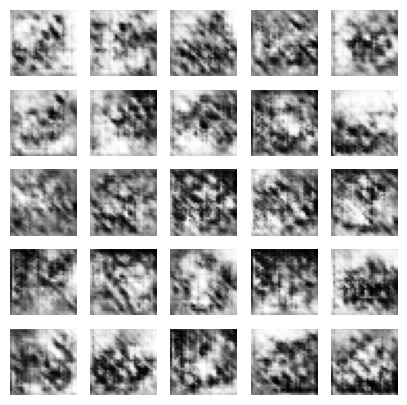

E:1, Loss G:0.694086492061615, Loss D:0.6938709616661072, Acc G:0.000366666674381122, Acc D:0.5002333521842957


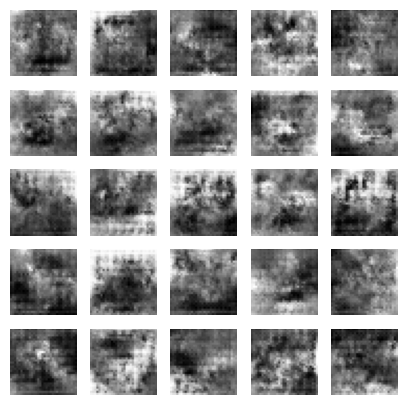

E:2, Loss G:0.6767336130142212, Loss D:0.6926482319831848, Acc G:0.00024444443988613784, Acc D:0.5001639127731323


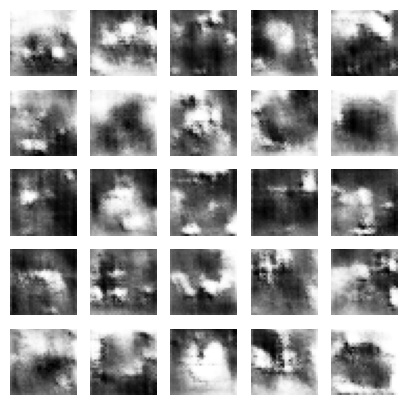

E:3, Loss G:0.698281466960907, Loss D:0.6962980031967163, Acc G:0.000183333337190561, Acc D:0.5001229047775269


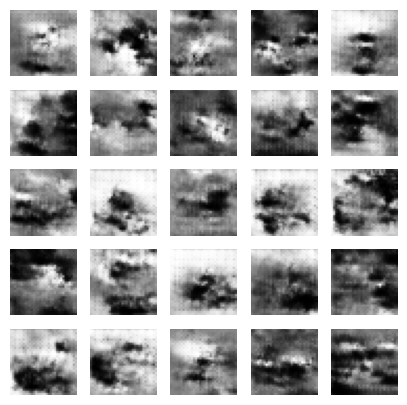

E:4, Loss G:0.6992712020874023, Loss D:0.6928724050521851, Acc G:0.00014666667266283184, Acc D:0.5000966787338257


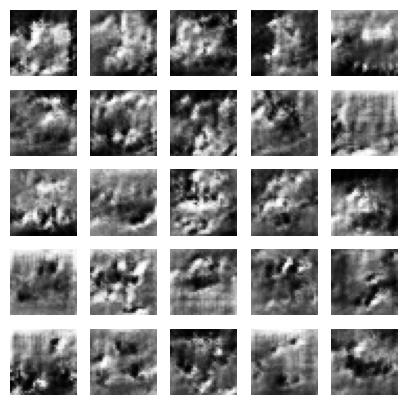

E:5, Loss G:0.6977231502532959, Loss D:0.6923140287399292, Acc G:0.0001250000059371814, Acc D:0.5000791549682617


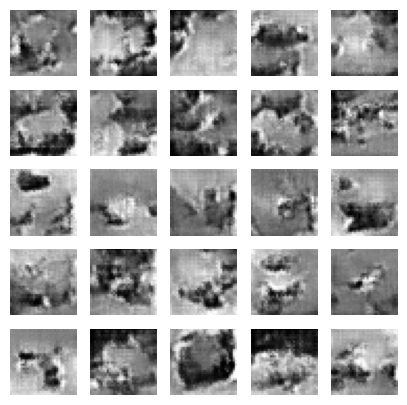

E:6, Loss G:0.7272230386734009, Loss D:0.6942811012268066, Acc G:0.00011666666978271678, Acc D:0.5000619292259216


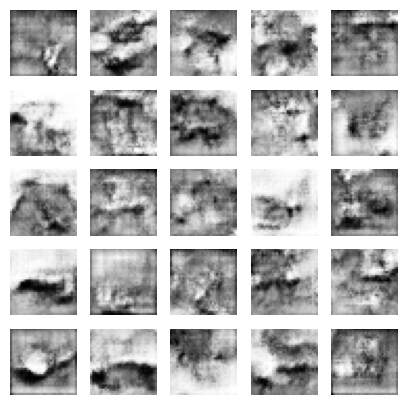

E:7, Loss G:0.6980479955673218, Loss D:0.6997843980789185, Acc G:0.00010416666918899864, Acc D:0.5000541806221008


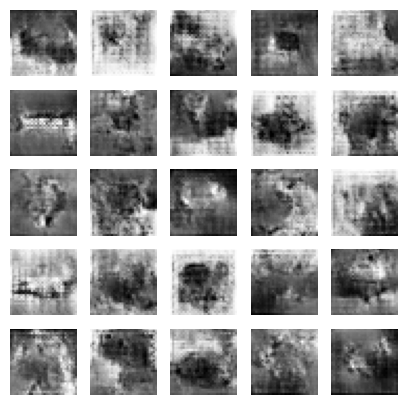

E:8, Loss G:0.7063273191452026, Loss D:0.6908653974533081, Acc G:9.999999747378752e-05, Acc D:0.5000675916671753


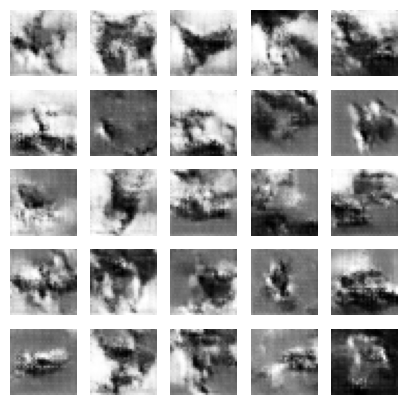

E:9, Loss G:0.737546980381012, Loss D:0.6983489990234375, Acc G:0.0001049999991664663, Acc D:0.5001358389854431


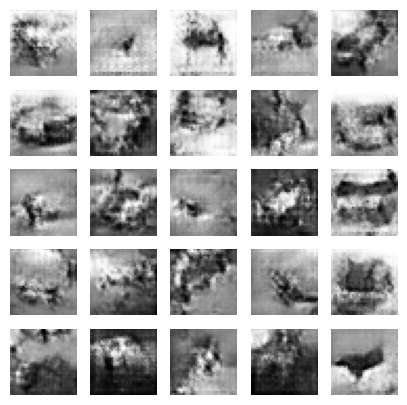

E:10, Loss G:0.6694095134735107, Loss D:0.713497519493103, Acc G:0.00012878788402304053, Acc D:0.5003098249435425


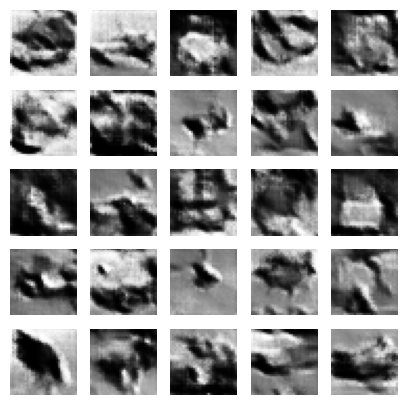

E:11, Loss G:0.676969051361084, Loss D:0.6971982717514038, Acc G:0.00018194444419350475, Acc D:0.5006389021873474


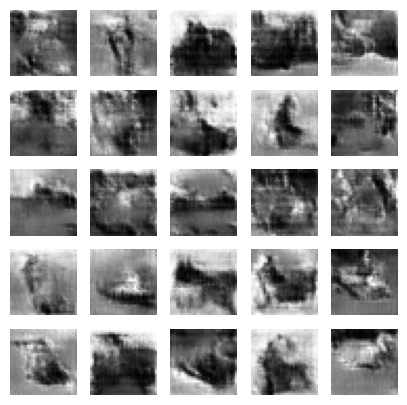

E:12, Loss G:0.7372340559959412, Loss D:0.7010078430175781, Acc G:0.00026282051112502813, Acc D:0.5010108947753906


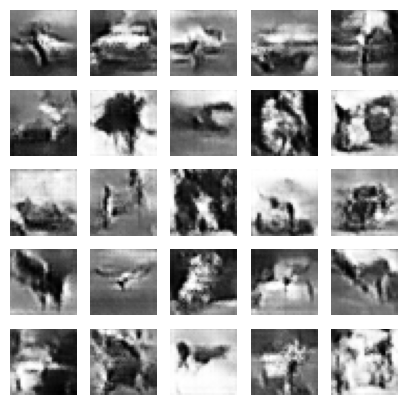

E:13, Loss G:0.7217081785202026, Loss D:0.6882823705673218, Acc G:0.0003571428533177823, Acc D:0.5013696551322937


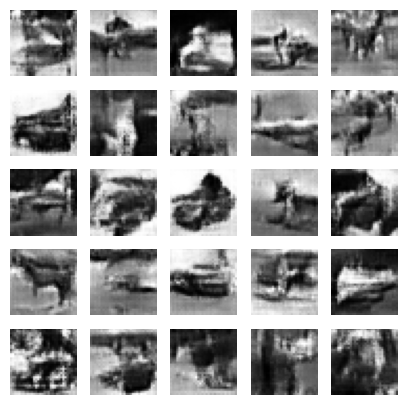

E:14, Loss G:0.7700912952423096, Loss D:0.6912634372711182, Acc G:0.00044777776929549873, Acc D:0.5017866492271423


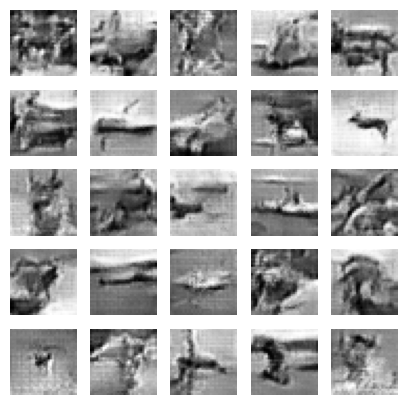

E:15, Loss G:0.7865403890609741, Loss D:0.6912714838981628, Acc G:0.0005739583284594119, Acc D:0.5022958517074585


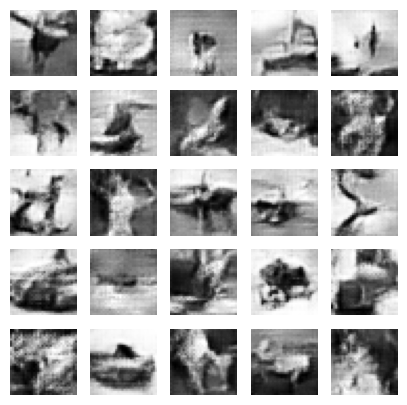

E:16, Loss G:0.7351877093315125, Loss D:0.6945179104804993, Acc G:0.0007392156985588372, Acc D:0.5028955936431885


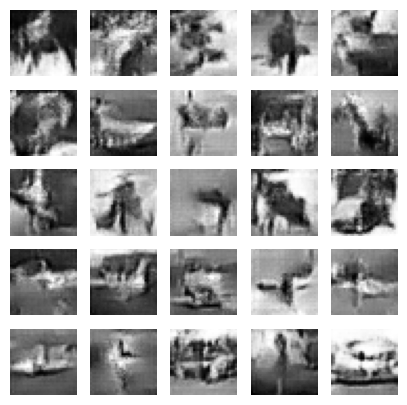

E:17, Loss G:0.6978452801704407, Loss D:0.6699025630950928, Acc G:0.0009129629470407963, Acc D:0.5036254525184631


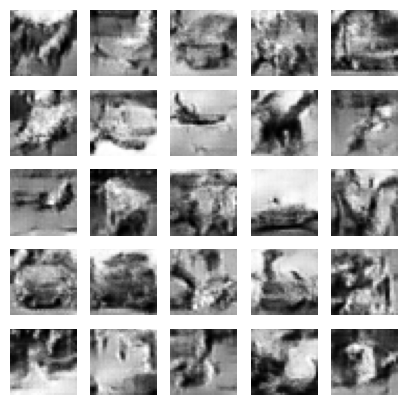

E:18, Loss G:0.6975713968276978, Loss D:0.6785072088241577, Acc G:0.001108771888539195, Acc D:0.5044447183609009


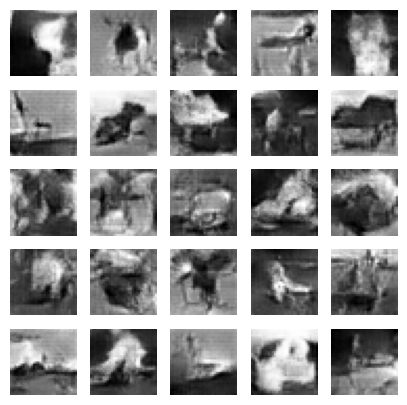

E:19, Loss G:0.7746623754501343, Loss D:0.6876257061958313, Acc G:0.0013516666367650032, Acc D:0.5054137706756592


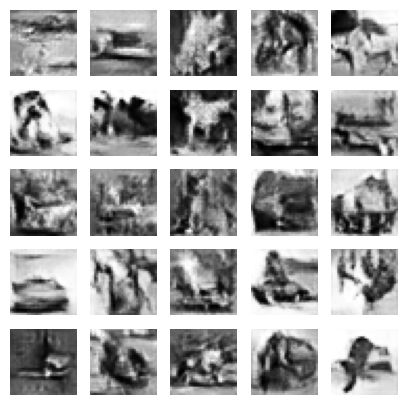

E:20, Loss G:0.7782559394836426, Loss D:0.6994037628173828, Acc G:0.0016619047382846475, Acc D:0.5064888596534729


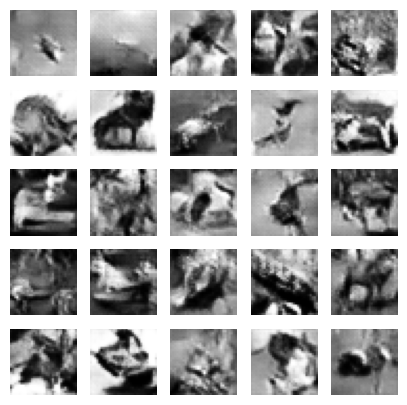

E:21, Loss G:0.7904171943664551, Loss D:0.680456817150116, Acc G:0.001996212173253298, Acc D:0.5075768828392029


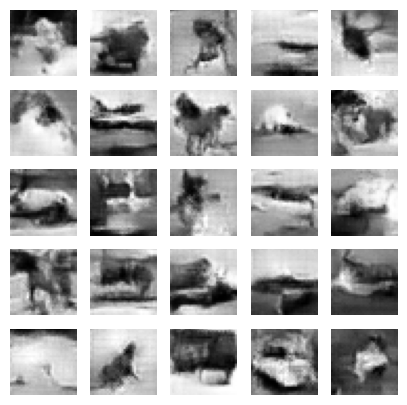

E:22, Loss G:0.8450993895530701, Loss D:0.6876033544540405, Acc G:0.0023920289240777493, Acc D:0.5088503360748291


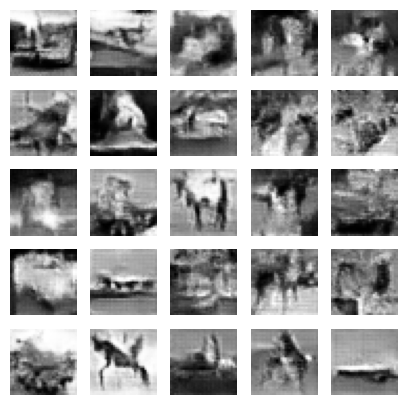

E:23, Loss G:0.7192299962043762, Loss D:0.6649797558784485, Acc G:0.0027895832899957895, Acc D:0.5101996660232544


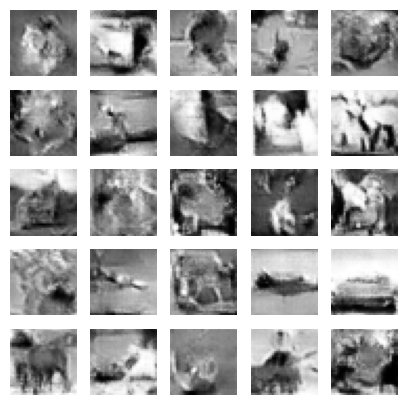

E:24, Loss G:0.9263050556182861, Loss D:0.6901923418045044, Acc G:0.0032586667221039534, Acc D:0.5117076635360718


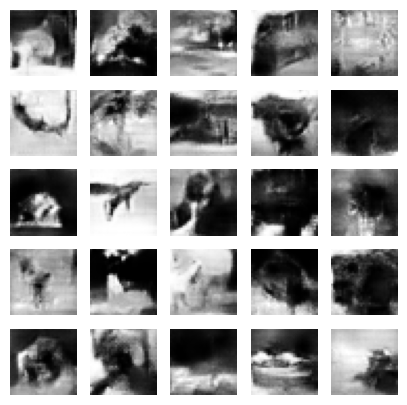

E:25, Loss G:0.9150536060333252, Loss D:0.66953444480896, Acc G:0.0038070513401180506, Acc D:0.5132846236228943


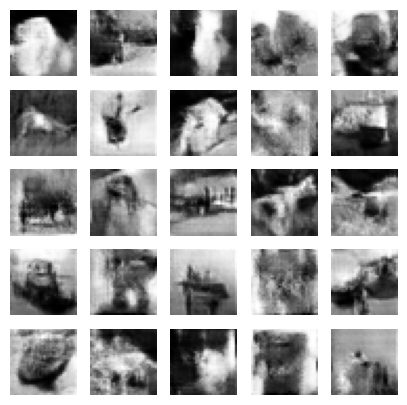

E:26, Loss G:0.77406907081604, Loss D:0.6620530486106873, Acc G:0.004308641888201237, Acc D:0.5148938298225403


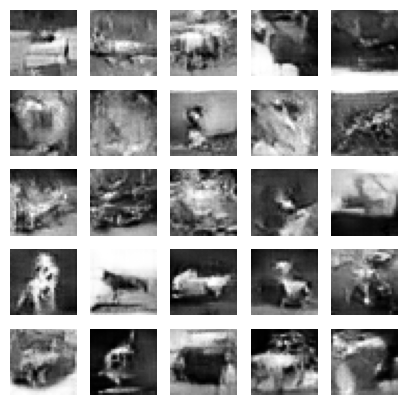

E:27, Loss G:0.8606117367744446, Loss D:0.7046486735343933, Acc G:0.004859523847699165, Acc D:0.5164818167686462


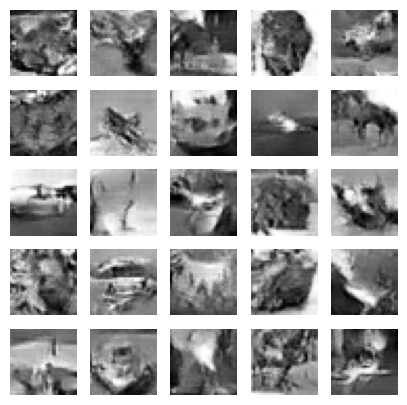

E:28, Loss G:0.8233151435852051, Loss D:0.6282265186309814, Acc G:0.005374137777835131, Acc D:0.5182362198829651


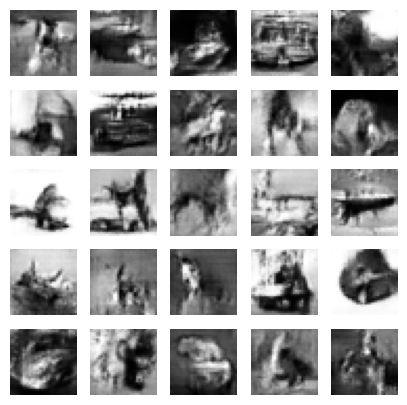

E:29, Loss G:0.9130843877792358, Loss D:0.6080695390701294, Acc G:0.005898888688534498, Acc D:0.5199577808380127


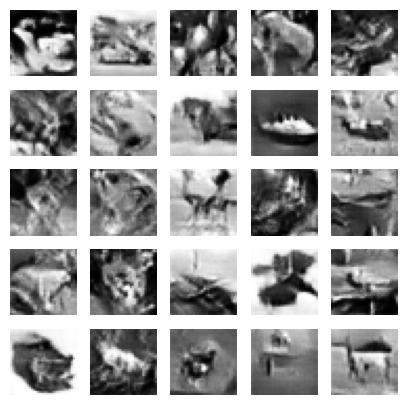

E:30, Loss G:0.9190848469734192, Loss D:0.6616041660308838, Acc G:0.006455376278609037, Acc D:0.5217207074165344


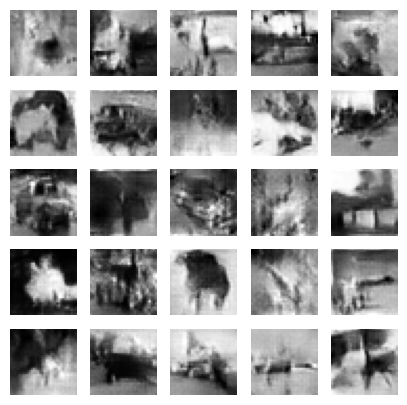

E:31, Loss G:0.8725632429122925, Loss D:0.608955442905426, Acc G:0.007001041434705257, Acc D:0.5235685110092163


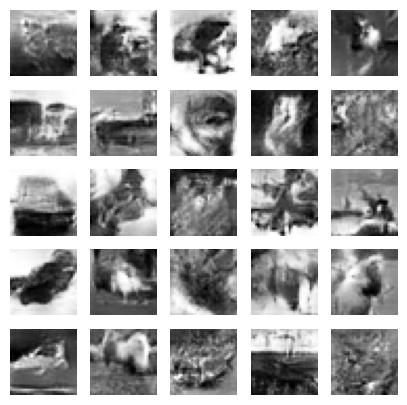

E:32, Loss G:0.8247799277305603, Loss D:0.611389696598053, Acc G:0.007536363787949085, Acc D:0.5254126191139221


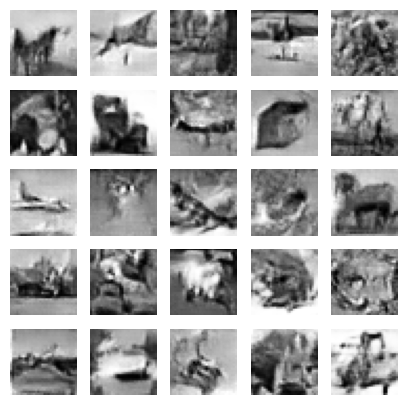

E:33, Loss G:0.9064806699752808, Loss D:0.6254192590713501, Acc G:0.008086764253675938, Acc D:0.5271803736686707


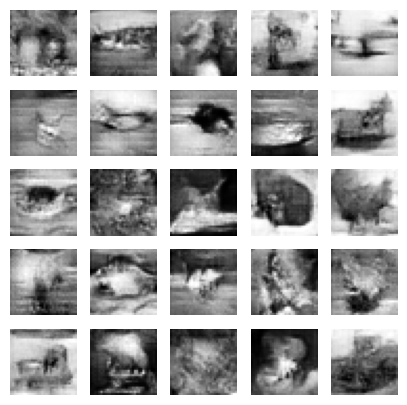

E:34, Loss G:0.9277489185333252, Loss D:0.7246400117874146, Acc G:0.008624762296676636, Acc D:0.529009997844696


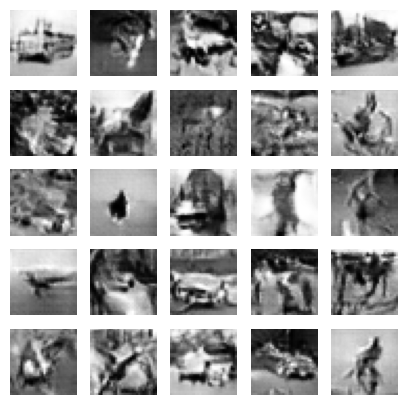

E:35, Loss G:0.9419004917144775, Loss D:0.6002179980278015, Acc G:0.00915879663079977, Acc D:0.5308048725128174


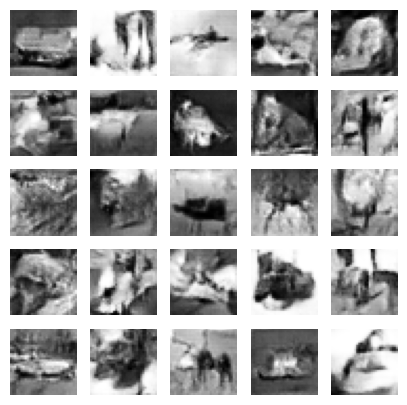

E:36, Loss G:0.8118612766265869, Loss D:0.6477401256561279, Acc G:0.009668017737567425, Acc D:0.5325939059257507


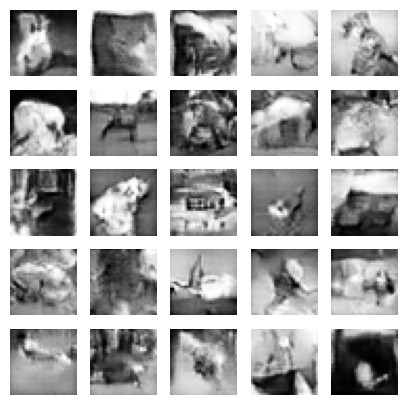

E:37, Loss G:0.862575888633728, Loss D:0.6470545530319214, Acc G:0.010186403058469296, Acc D:0.5343791842460632


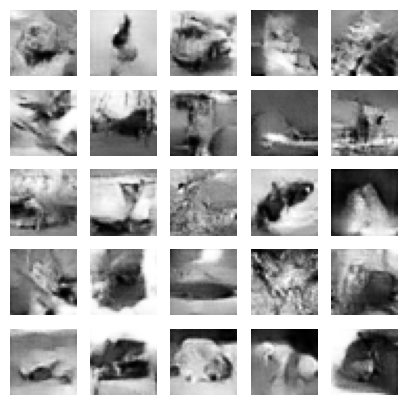

E:38, Loss G:0.8699553608894348, Loss D:0.692303478717804, Acc G:0.010697863064706326, Acc D:0.5361944437026978


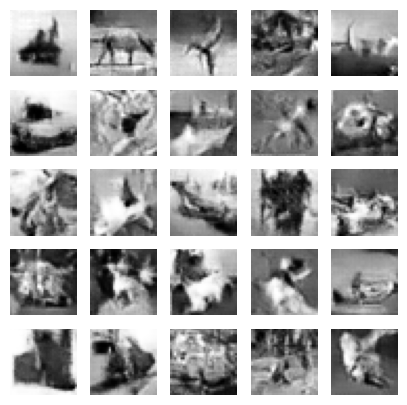

E:39, Loss G:0.8819807171821594, Loss D:0.6727299690246582, Acc G:0.011211249977350235, Acc D:0.537997305393219


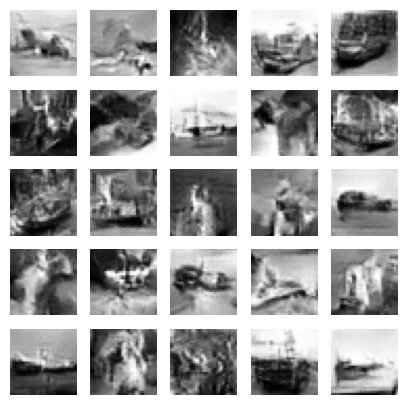

E:40, Loss G:0.9630246162414551, Loss D:0.5760769844055176, Acc G:0.011700812727212906, Acc D:0.5397951006889343


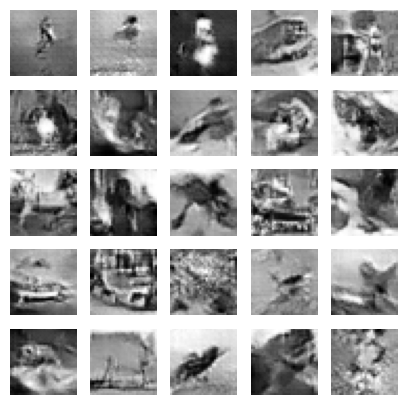

E:41, Loss G:0.9794889688491821, Loss D:0.5474158525466919, Acc G:0.012146031484007835, Acc D:0.5416037440299988


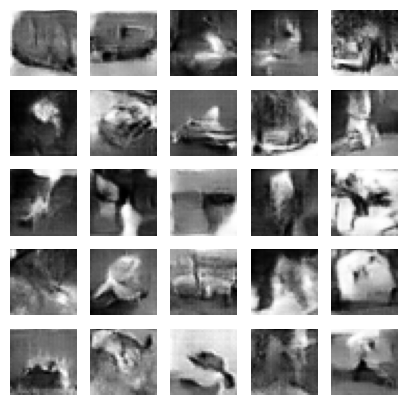

E:42, Loss G:0.9498313069343567, Loss D:0.6419849395751953, Acc G:0.012580620124936104, Acc D:0.5434300303459167


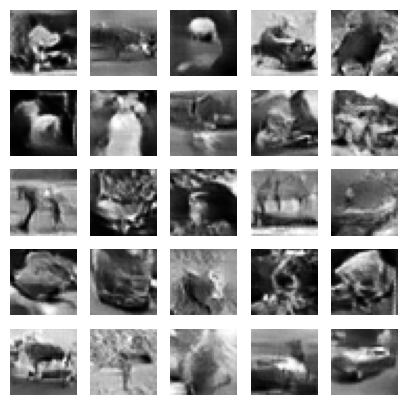

E:43, Loss G:1.0295186042785645, Loss D:0.5851585865020752, Acc G:0.013023484498262405, Acc D:0.5452988743782043


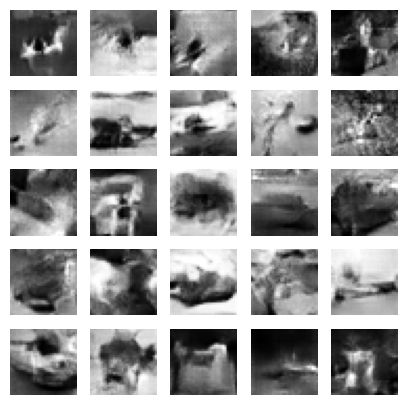

E:44, Loss G:1.061506986618042, Loss D:0.5734872817993164, Acc G:0.013478518463671207, Acc D:0.5471248030662537


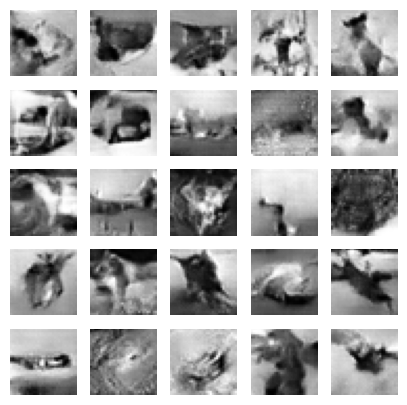

E:45, Loss G:1.1259701251983643, Loss D:0.5765823721885681, Acc G:0.013918478041887283, Acc D:0.5489487051963806


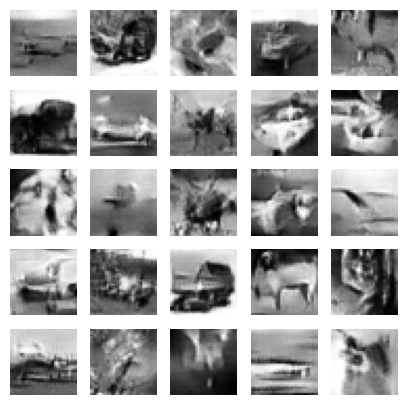

E:46, Loss G:1.0668680667877197, Loss D:0.6007235050201416, Acc G:0.01430035475641489, Acc D:0.550808310508728


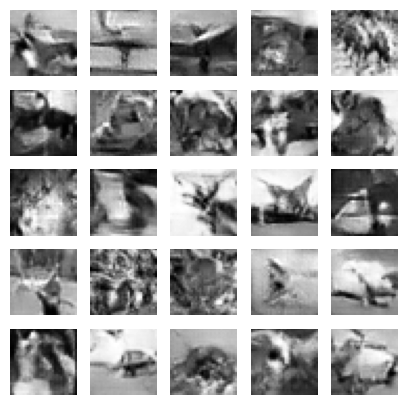

E:47, Loss G:0.8788813352584839, Loss D:0.6196107864379883, Acc G:0.014713541604578495, Acc D:0.5526649355888367


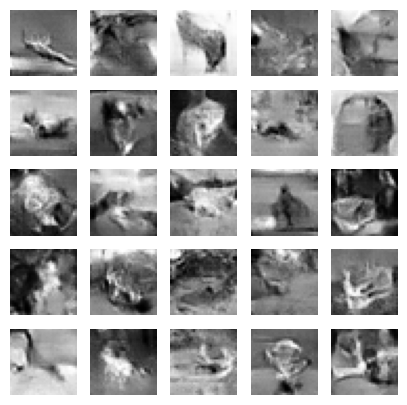

E:48, Loss G:1.01387619972229, Loss D:0.6603551506996155, Acc G:0.015111224725842476, Acc D:0.5545141100883484


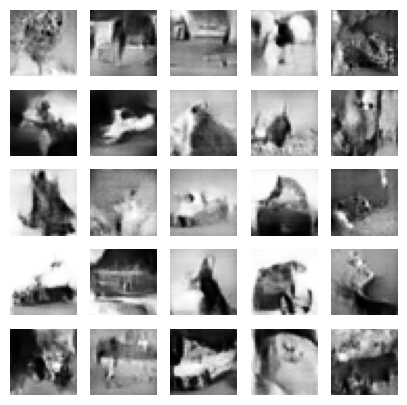

E:49, Loss G:1.0528569221496582, Loss D:0.6418081521987915, Acc G:0.015471667051315308, Acc D:0.5564161539077759


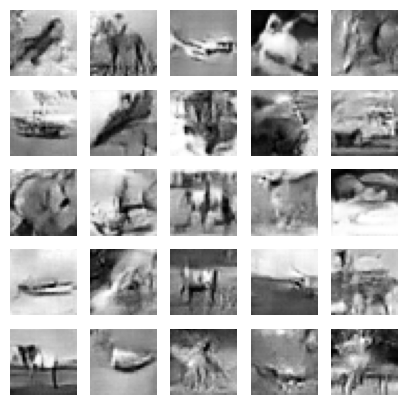

E:50, Loss G:1.2023415565490723, Loss D:0.5600385665893555, Acc G:0.015838561579585075, Acc D:0.558279275894165


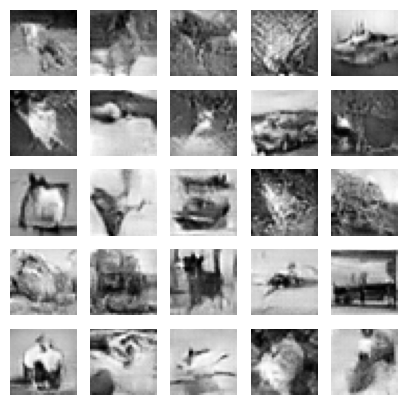

E:51, Loss G:1.0092742443084717, Loss D:0.6272775530815125, Acc G:0.01619551330804825, Acc D:0.5601605772972107


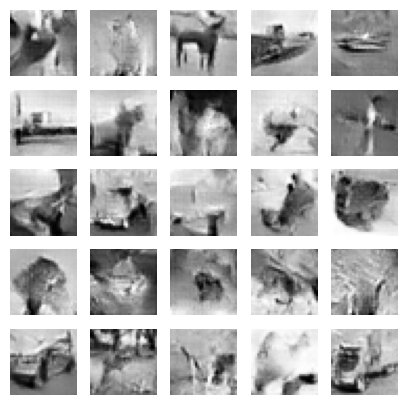

E:52, Loss G:1.027198314666748, Loss D:0.6041712760925293, Acc G:0.016547799110412598, Acc D:0.5620490312576294


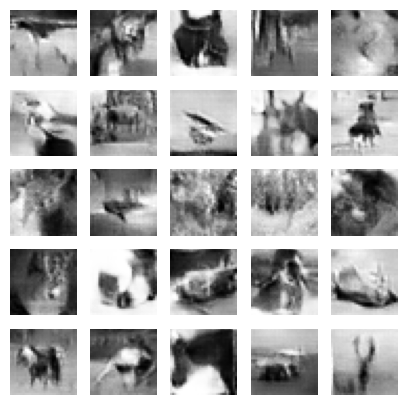

E:53, Loss G:1.073819637298584, Loss D:0.6362777352333069, Acc G:0.016879629343748093, Acc D:0.5639228224754333


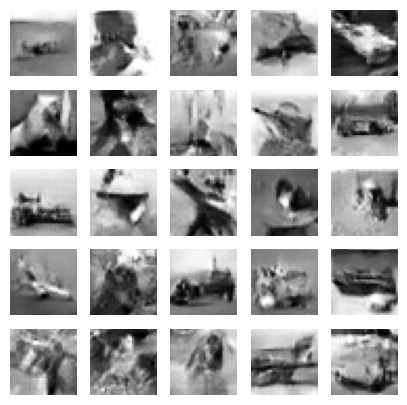

E:54, Loss G:1.3461508750915527, Loss D:0.5512501001358032, Acc G:0.017191514372825623, Acc D:0.5658009052276611


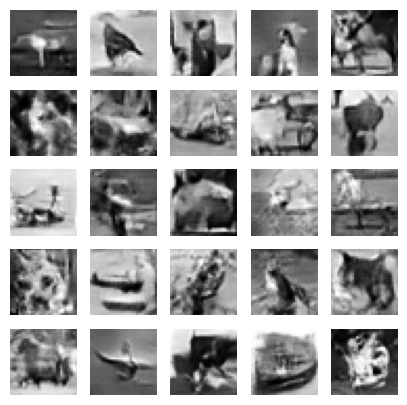

E:55, Loss G:1.0867295265197754, Loss D:0.550338625907898, Acc G:0.017453571781516075, Acc D:0.5677453875541687


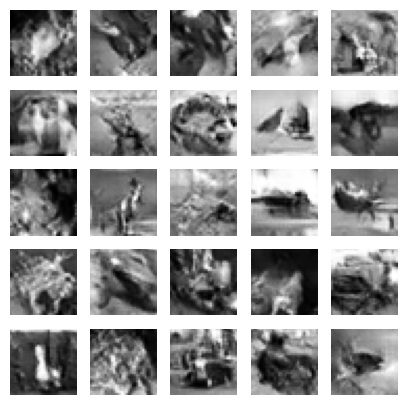

E:56, Loss G:1.247665524482727, Loss D:0.5003995895385742, Acc G:0.017726315185427666, Acc D:0.5696406364440918


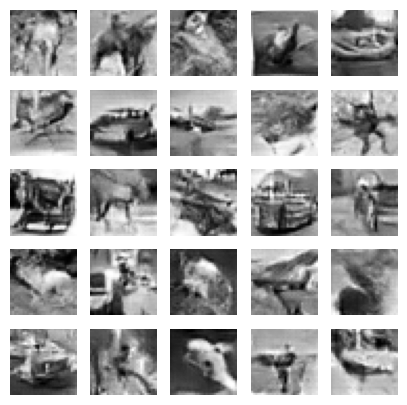

E:57, Loss G:1.2323713302612305, Loss D:0.5730831623077393, Acc G:0.018012642860412598, Acc D:0.5715294480323792


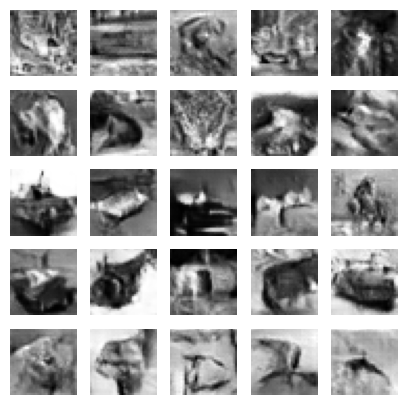

E:58, Loss G:1.1196861267089844, Loss D:0.5045219659805298, Acc G:0.01829124242067337, Acc D:0.573416531085968


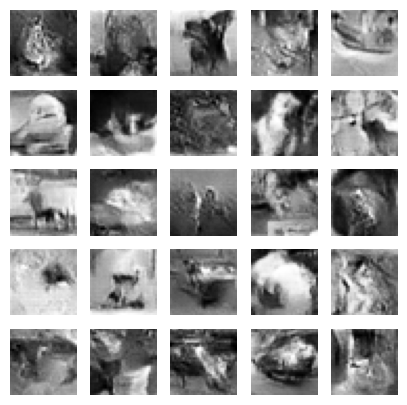

E:59, Loss G:1.465543270111084, Loss D:0.6132352352142334, Acc G:0.01854916661977768, Acc D:0.5752893090248108


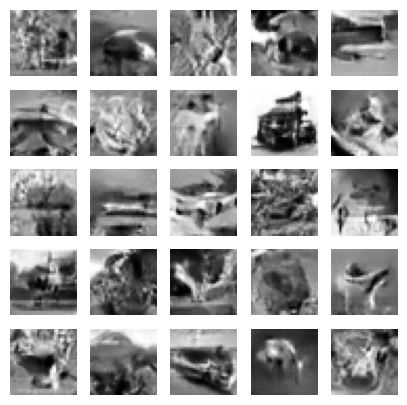

E:60, Loss G:1.0325927734375, Loss D:0.6093276143074036, Acc G:0.018798360601067543, Acc D:0.5772269368171692


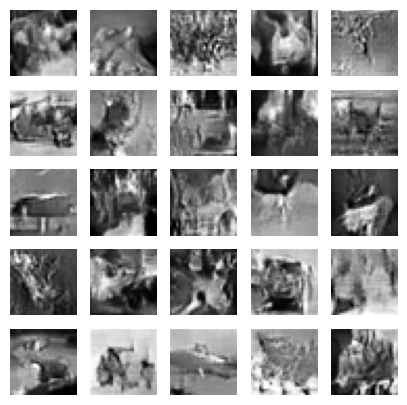

E:61, Loss G:1.1410112380981445, Loss D:0.6205301284790039, Acc G:0.019025806337594986, Acc D:0.5791170597076416


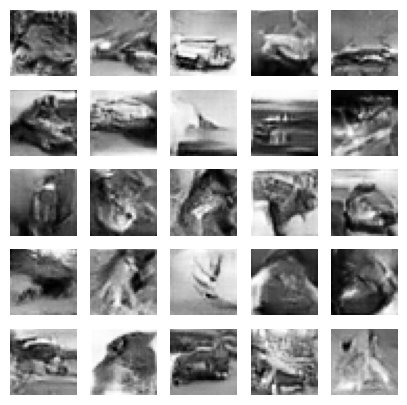

E:62, Loss G:1.3439300060272217, Loss D:0.4880886673927307, Acc G:0.0192362442612648, Acc D:0.5810372829437256


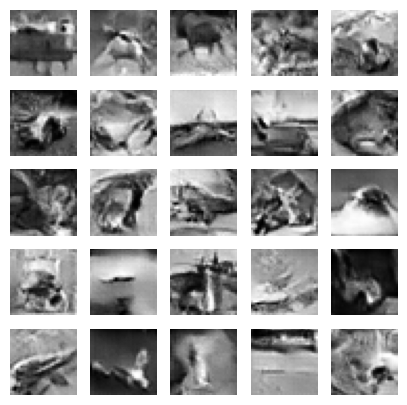

E:63, Loss G:1.4251840114593506, Loss D:0.5513565540313721, Acc G:0.019434375688433647, Acc D:0.5829683542251587


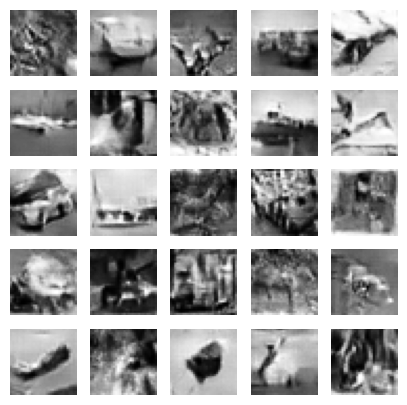

E:64, Loss G:1.476227045059204, Loss D:0.48274892568588257, Acc G:0.019614359363913536, Acc D:0.584869384765625


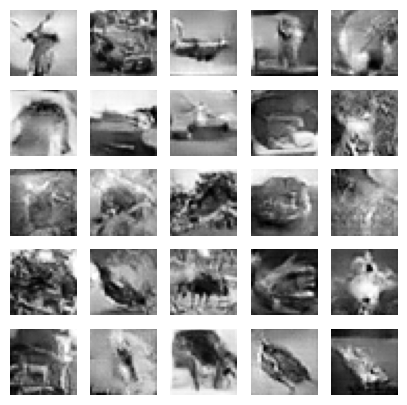

E:65, Loss G:1.5228636264801025, Loss D:0.5670894384384155, Acc G:0.01979292929172516, Acc D:0.5867763757705688


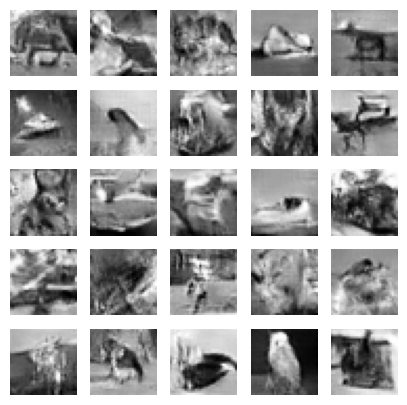

E:66, Loss G:1.1144403219223022, Loss D:0.5768055319786072, Acc G:0.019965671002864838, Acc D:0.5886856913566589


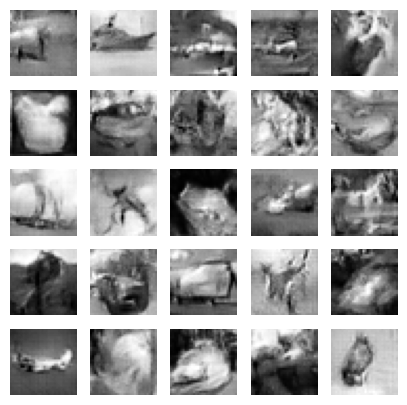

E:67, Loss G:1.2657318115234375, Loss D:0.5241603851318359, Acc G:0.020127205178141594, Acc D:0.5905948281288147


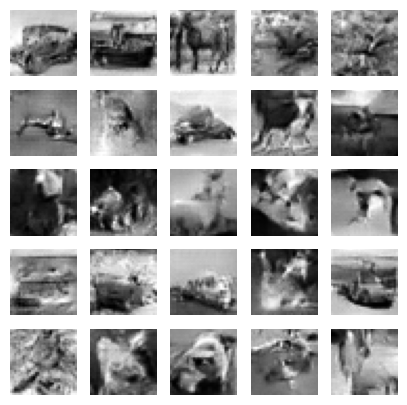

In [34]:
for epoch in range(500):    
    dLossSum = 0
    gLossSum = 0
    dAccSum = 0
    gAccSum = 0
    cnt = 0


    for batch in dataset:

        dResult= trainDstep(batch)
        gResult = trainGstep(batch)
        
        # dLossSum += dLoss["discriminator_loss"]
        # gLossSum += gLoss["generator_loss"]
        # dAccSum += dLoss["discriminator_accuracy"]
        # gAccSum += gLoss["generator_accuracy"]
        cnt += 1

    # print("E:{}, Loss G:{}, Loss D:{}, Acc G:{}, Acc D:{}".format(epoch, gLossSum/cnt, dLossSum/cnt, 100*gAccSum/cnt, 100*dAccSum/cnt))
    print("E:{}, Loss G:{}, Loss D:{}, Acc G:{}, Acc D:{}".format(epoch, gResult["generator_loss"], dResult["discriminator_loss"], gResult["generator_accuracy"], dResult["discriminator_accuracy"]))
    
    plotImages(generator)
        
        